<a href="https://colab.research.google.com/github/oamerl/machine-learning-projects/blob/main/Reinforcement-Learning/taxi-v3-game-environment/Taxi_v3_game_environment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Using  of QLearning ,  SARSA, Double Q-learning and Deep Q learning for Taxi RL problem


In [ ]:
!pip install -q gym gym[all]
!pip install -q pyvirtualdisplay
!apt-get install -y xvfb python-opengl ffmpeg
!pip install -q moviepy
!pip install -q imageio_ffmpeg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.0/297.0 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 24.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 15.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 47.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 22.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.2/208.2 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 kB 7.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This 

In [ ]:
!pip show gym

Name: gym
Version: 0.25.2
Summary: Gym: A universal API for reinforcement learning environments
Home-page: https://www.gymlibrary.ml/
Author: Gym Community
Author-email: jkterry@umd.edu
License: MIT
Location: c:\users\ad\anaconda3\envs\tf-gpu\lib\site-packages
Requires: cloudpickle, gym-notices, importlib-metadata, numpy
Required-by: flappy-bird-gym, gym-chrome-dino
Note: you may need to restart the kernel to use updated packages.


Needed Libraries

In [ ]:
import gym
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import sys
from collections import deque
from collections import defaultdict

from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential

import random
import pickle as pk
import pylab
import gc

import plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.tools import make_subplots


# the following code ensures that we can see print results for multiple tasks within a coding block
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

Animation Setup for Displaying Test Results

This part was taken from an online resource to help us visualize the agent's interaction with the environment through different actions.

In [ ]:
# to avoid the warning massage
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# from pyvirtualdisplay import Display
# display = Display(visible=0, size=(1400, 900))
# display.start()

import glob
import io
import base64
from IPython.display import HTML
from IPython import display as ipythondisplay
from matplotlib import animation
from moviepy.video.io.ImageSequenceClip import ImageSequenceClip
import cv2

def dispaly_video(file):

  mp4 = file
  video = io.open(mp4, 'r+b').read()
  encoded = base64.b64encode(video)
  ipythondisplay.display(HTML(data='''<video alt="test" autoplayloop controls style="height: 400px;">
              <source src="data:video/mp4;base64,{0}" type="video/mp4" />
            </video>'''.format(encoded.decode('ascii'))))


def render(frames, file_prefix):
  fps = 5.0
  clip = ImageSequenceClip(frames, fps=fps)
  clip.write_videofile(file_prefix + '_output.mp4')
  dispaly_video(file_prefix + '_output.mp4')


def render_double_ql(frames, filename):
    plt.figure(figsize=(frames[0].shape[1]/72.0, frames[0].shape[0]/72.0), dpi=72)
    patch = plt.imshow(frames[0])
    plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval=50)
    anim.save(filename + '.mp4', writer=animation.FFMpegWriter(fps=60))
    return HTML(anim.to_jshtml())



## Define the Environment

[taxi gym env](https://gymnasium.farama.org/environments/toy_text/taxi/)

In [ ]:
#show different state for the taxi
env = gym.make('Taxi-v3')
env.reset()
# plt.imshow(env.render(mode='rgb_array'))

103

# Random agent

#### let us study the random action and  after How many steps the model will converage

In [ ]:
env.step(env.action_space.sample())

(203,
 -1,
 False,
 {'prob': 1.0, 'action_mask': array([1, 1, 1, 0, 0, 0], dtype=int8)})

In [ ]:
# let the environment to take random states  until he succed to reach at once
average=0
episo=10
for i in range(episo):
  env.reset()
  reward=0
  count=0 # this will count the number of step  the aget take until it gain reward =20
  while reward !=20:
    state, reward,done,info=env.step(env.action_space.sample())
    count +=1
    #print(f"reward={reward} , state= {state}")
  average+=count
  print(f" the total number of steps agent need to reach to +20 reward is :{count} ")

434

 the total number of steps agent need to reach to +20 reward is :521 


274

 the total number of steps agent need to reach to +20 reward is :1069 


26

 the total number of steps agent need to reach to +20 reward is :109 


1

 the total number of steps agent need to reach to +20 reward is :2599 


327

 the total number of steps agent need to reach to +20 reward is :3889 


402

 the total number of steps agent need to reach to +20 reward is :851 


401

 the total number of steps agent need to reach to +20 reward is :2951 


131

 the total number of steps agent need to reach to +20 reward is :2874 


447

 the total number of steps agent need to reach to +20 reward is :125 


162

 the total number of steps agent need to reach to +20 reward is :7251 


In [ ]:
print(f"For 10 episodes the model need on average {average/episo} random steps until he reach his goal  ")

For 10 episodes the model need on average 2223.9 random steps until he reach his goal  


How can the reinforcement  algorithm help us solve this problem, and how might more applicable solutions be provided using Q-learning, SARSA, Double Q-learning, and deep learning methods, let's discover together

In [ ]:
env = gym.make('Taxi-v3')
state = env.reset()

In [ ]:
def random_agent(env):
  episodes = 5
  rewards = []
  frames = []


  for episode in range(1, episodes+1):
      state = env.reset()
      done = False
      total_rewards = 0 # this way to intialize the number of different state instead the way th way to have population is the last way

      while not done:

          frames.append(env.render(mode="rgb_array"))

          action = env.action_space.sample()#random.choice([0,1,2,3,4,5])

          n_state, reward, done, info = env.step(action)
          #print(f"nest_state= {n_state}, reward ={reward},info={info}")

          total_rewards+=reward
      rewards.append(total_rewards)
      print('Episode:{} Score:{}'.format(episode, total_rewards)) # this is the reward of each episode until reach the done = True.

  env.close()
  print('Mean reward:{}'.format(sum(rewards)/len(rewards)))# the mean reward for this trial

  fig = plt.figure()
  ax = fig.add_subplot(111)

  plt.plot(np.arange(1, len(rewards)+1), rewards)

  plt.ylabel('rewards')
  plt.xlabel('number of Episodes')
  plt.show()

  return frames

Episode:1 Score:-812
Episode:2 Score:-803
Episode:3 Score:-848
Episode:4 Score:-740
Episode:5 Score:-830
Mean reward:-806.6


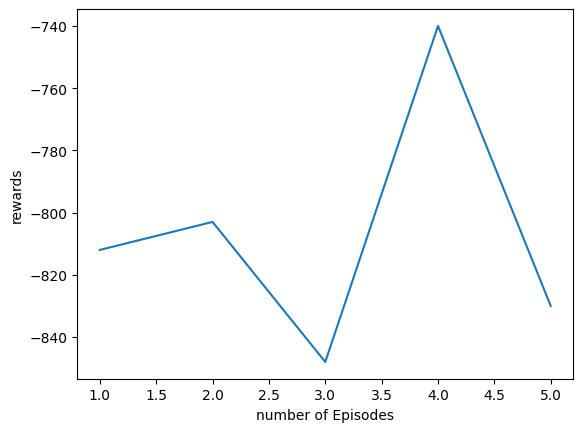

In [ ]:
frames = random_agent(env)

In [ ]:
render(frames, 'random')

Moviepy - Building video random_output.mp4.
Moviepy - Writing video random_output.mp4



Moviepy - Done !
Moviepy - video ready random_output.mp4


# **Q-Learning**

Epsilon Greedy Policy

In [ ]:
def epsilon_greedy(state,Q,epsilon = 0.1):

    if np.random.uniform(0,1) <= epsilon: # explore - choose a random action
        action = np.random.randint(0, env.action_space.n)

    else: # exploit
        action = np.argmax(Q[state])

    return action

Q-Learning Agent

In [ ]:
def q_learning_agent(env,
                     num_episodes=100,
                     epsilon=0.1,
                     alpha=0.9,
                     gamma=0.9,
                     test_while_train=False):

    # quality function grid values -> Dictionary - keys: state(as a tuple) , values: action values (as an array where index is action)
    Q_l = defaultdict(lambda: np.zeros(env.action_space.n))

    rewards_list = [] # rewards per episode
    timesteps_list =[] # timesteps per espisode
    q_success_list = []

    for i in range(num_episodes):
        # Reset environment
        state = env.reset()
        total_reward_per_eps = 0 # accrued rewards during current episode
        time_steps_per_eps=0 # number of time steps taken during current episode
        done = False

        #The Q-Table learning algorithm

        while not done:

            # action taken based on epsilon greedy policy
            action = epsilon_greedy(state, Q_l, epsilon)

            # Get new state & reward from environment
            next_state, reward, done, _ = env.step(action)

            # Q-Learning update
            Q_l[state][action] =  Q_l[state][action] + alpha * (reward + (gamma * max(Q_l[next_state])) - Q_l[state][action])

            total_reward_per_eps += reward
            time_steps_per_eps +=1 # number of steps taken in the episode till reaching terminal state
            state = next_state

        rewards_list.append(total_reward_per_eps)
        timesteps_list.append(time_steps_per_eps)


        if test_while_train:
            test_log_step = 10 # test performance, after every 10 episodes of training.

            if i % test_log_step == 0 and i != 0:

                test_episodes = 5 # test for 5 episodes and report mean over them
                testing_rewards = []
                testing_timesteps =[]

                for test_eps in range(test_episodes):
                    # Reset environment
                    s = env.reset() # state
                    d = False # done flag
                    rewards_per_test_eps = 0
                    timesteps_per_test_eps = 0

                    while d != True:
                        a = np.argmax(Q_l[s]) # greedy action is taken
                        n_s,r,d,_ = env.step(a)
                        s = n_s
                        rewards_per_test_eps += r
                        timesteps_per_test_eps +=1

                    testing_rewards.append(rewards_per_test_eps)
                    testing_timesteps.append(timesteps_per_test_eps)

                print(f"Testing results after {i} Episodes    Average Timesteps:{np.mean(testing_timesteps)}    Average Reward:{np.mean(testing_rewards)}")


    return rewards_list, timesteps_list, Q_l

Environment Initialization

In [ ]:
env = gym.make("Taxi-v3") # training environment

Hyperparameters Tuning for Q-Learning

In [ ]:
ql_q_values_dict = {} # dictionary to save the Q function values for each epsilon and alpha pairs

ql_time_steps_per_episode_dict = {} # dictionary to save the time steps per episode for each epsilon and alpha pairs
ql_rewards_per_episode_dict = {} # dictionary to save the accrued rewards per episode for each epsilon alpha pair

ql_accum_time_steps_per_episode_dict = {} # dictionary to save the accumulated time steps per episode for each epsilon and alpha pairs
ql_accum_rewards_per_episode_dict = {}


for epsilon in [0.01, 0.05, 0.1, 0.15]: # epsilon greedy exploration rate
    for alpha in [0.2, 0.4, 0.6, 0.8, 1]: # learning rate

        rewards_list, timesteps_list, Q_l = q_learning_agent(env,
                                                            num_episodes=15000,
                                                            epsilon=epsilon,
                                                            alpha=alpha,
                                                            test_while_train=False)

        ql_time_steps_per_episode_accum = np.cumsum(timesteps_list)
        ql_rewards_per_episode_accum = np.cumsum(rewards_list)

        ql_q_values_dict[(epsilon, alpha)] = Q_l
        ql_time_steps_per_episode_dict[(epsilon, alpha)] = timesteps_list
        ql_rewards_per_episode_dict[(epsilon, alpha)] = rewards_list

        ql_accum_time_steps_per_episode_dict[(epsilon, alpha)] = ql_time_steps_per_episode_accum
        ql_accum_rewards_per_episode_dict[(epsilon, alpha)] = ql_rewards_per_episode_accum


In [ ]:
# plotting the different accumulated time steps for each epsilon and alpha
fig = make_subplots(rows=1,cols=1)
for key,values in ql_accum_rewards_per_episode_dict.items():
    fig.append_trace(go.Scatter(x=np.arange(1, len(values) + 1), #
                                y=values,
                                name= "epsilon = {}, alpha= {}".format(key[0],key[1]),
                                mode ='lines',
                                hoverlabel=dict(namelength=-1)
                                ),
                     row=1,
                     col=1)

fig.update_layout(title =  "Q-Learning Accumulated Rewards for Different Epsilon and Alpha",
                  xaxis_title = "Episodes",
                  yaxis_title = "Accumulated Reward")


Obtaining the reached Optimal Hyperparameters Values

In [ ]:
# obtaining the optimal epsilon and alpha pair based in the smallest average number of steps taken across all episodes
ql_eps_alpha_pair = [] # list of epsilon_alpha pairs tuple
ql_steps_taken = [] # list of lists of steps taken for each epsilon_alpha pair
ql_rewards_accrued = [] # list of lists of accrued rewards for each epsilon_alpha pair

for key,values in ql_time_steps_per_episode_dict.items(): # values is a list (timesteps for each eps)
    ql_eps_alpha_pair.append(key)
    ql_steps_taken.append(values)

for key,values in ql_rewards_per_episode_dict.items(): # values is a list (reward in each eps)
    ql_rewards_accrued.append(values)

ql_steps_taken = np.array(ql_steps_taken) # converting list to numpy array
mean_steps_taken = np.mean(ql_steps_taken, axis =1) # calculating mean number of steps for each epsilon_alpha pair
min_mean_steps_index = np.argmin(mean_steps_taken) # getting the index of the smallest mean number of steps

ql_rewards_accrued = np.array(ql_rewards_accrued)
mean_rewards_accrued = np.mean(ql_rewards_accrued, axis =1)
max_mean_rewards_accrued_index = np.argmax(mean_rewards_accrued)

#print(min_mean_steps_index == max_mean_rewards_accrued_index)

ql_optimal_epsilon_alpha_pair = ql_eps_alpha_pair[min_mean_steps_index] # using the obtained index to get the corresponds optimal epsilon alpha pair values
print(f"Optimal epsilon is {ql_optimal_epsilon_alpha_pair[0]} with optimal alpha equal {ql_optimal_epsilon_alpha_pair[1]}, \nAverage number of steps: {np.min(mean_steps_taken)} and average reward: {np.max(mean_rewards_accrued)} overall training episodes")

Optimal epsilon is 0.01 with optimal alpha equal 1, 
Average number of steps: 14.00395 and average reward: 6.2336 overall training episodes


Using Optimal Hyperparameters to train the Q-learning Agent and show testing performance every 10 episodes

In [ ]:
optimal_epsilon = ql_optimal_epsilon_alpha_pair[0]
optimal_alpha = ql_optimal_epsilon_alpha_pair[1]

optimal_ql_rewards_list, optimal_ql_timesteps_list, optimal_Q_l = q_learning_agent(env,
                                                                                    num_episodes=15000,
                                                                                    epsilon=optimal_epsilon,
                                                                                    alpha=optimal_alpha,
                                                                                    test_while_train=True) # set "test_while_train" to True to monitor testing results

accum_timesteps = np.cumsum(optimal_ql_timesteps_list)
accum_rewards = np.cumsum(optimal_ql_rewards_list)

Testing results after 10 Episodes    Average Timesteps:200.0    Average Reward:-560.0
Testing results after 20 Episodes    Average Timesteps:200.0    Average Reward:-916.4
Testing results after 30 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 40 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 50 Episodes    Average Timesteps:161.4    Average Reward:-157.2
Testing results after 60 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 70 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 80 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 90 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 100 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 110 Episodes    Average Timesteps:162.4    Average Reward:-158.2
Testing results after 120 Episodes    Average Timest

Optimal Q-learning Convergence Curves

Text(0.5, 0, 'Episode')

Text(0.5, 0, 'Episode')

Text(0, 0.5, 'Q-Learning Reward')

Text(0, 0.5, 'Q-Learning Time Steps')

Text(0.5, 0.98, 'Q-Learning Convergence Curves')

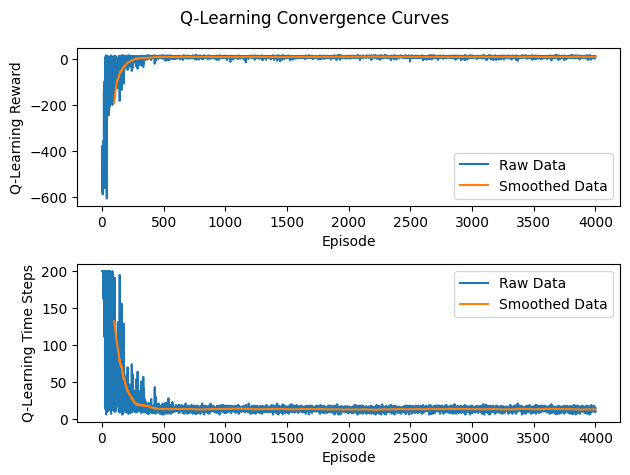

In [ ]:
# Plot the performance over time
fig, axs = plt.subplots(2)
axs[0].set_xlabel("Episode")
axs[1].set_xlabel("Episode")
axs[0].set_ylabel("Q-Learning Reward")
axs[1].set_ylabel("Q-Learning Time Steps")

# Data
num_episodes = len(optimal_ql_timesteps_list[:4000])
rewards_per_episode = optimal_ql_rewards_list[:4000]
steps_per_episode = optimal_ql_timesteps_list[:4000]

# Plot the raw data
axs[0].plot(range(num_episodes), rewards_per_episode, label='Raw Data')
axs[1].plot(range(num_episodes), steps_per_episode, label='Raw Data')

# Plot the smoothed data
window = 100
rewards_smoothed = np.convolve(rewards_per_episode, np.ones(window)/window, mode='valid')
steps_smoothed = np.convolve(steps_per_episode, np.ones(window)/window, mode='valid')

axs[0].plot(range(window-1, num_episodes), rewards_smoothed, label='Smoothed Data')
axs[1].plot(range(window-1, num_episodes), steps_smoothed, label='Smoothed Data')

axs[0].legend()
axs[1].legend()

plt.suptitle("Q-Learning Convergence Curves")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Q-Learning Accumulated Time Steps')

Text(0.5, 0, 'Time steps')

Text(0, 0.5, 'Episodes')

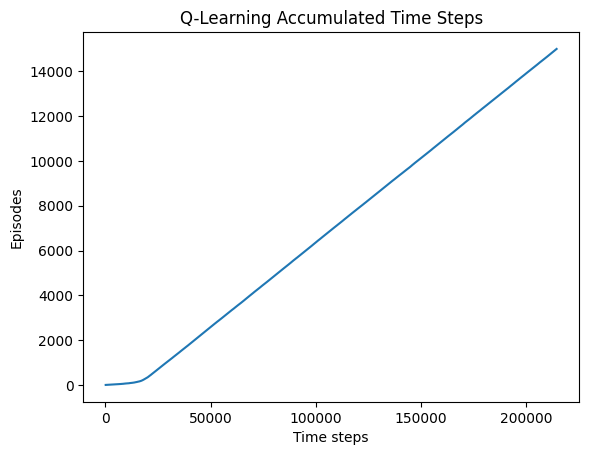

Text(0.5, 1.0, 'Q-Learning Accumulated Rewards')

Text(0.5, 0, 'Episodes')

Text(0, 0.5, 'Accumulated Reward per Episode')

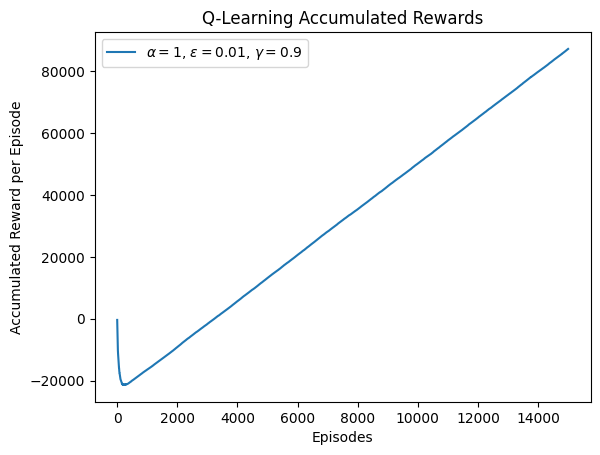

In [ ]:
plt.plot(accum_timesteps, np.arange(1, len(accum_timesteps) + 1))
plt.title('Q-Learning Accumulated Time Steps')
plt.xlabel('Time steps')
plt.ylabel('Episodes')
plt.show()

plt.plot(np.arange(1, len(accum_rewards) + 1), accum_rewards, label= r'$\alpha = 1$, $\epsilon = 0.01$, $\gamma = 0.9$')
plt.title('Q-Learning Accumulated Rewards')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward per Episode')
plt.legend()
plt.show()

Animated Test results for Q-Learning

In [ ]:
frames = []
r_total_qlearning  = 0
trials=4

for i in range(trials):
    # Reset environment
    s = env.reset()
    d = False

    #env.render(mode='rgb_array')#env.render()
    #plt.imshow(env.render(mode='rgb_array'))
    frames.append(env.render(mode="rgb_array"))
    #The Q-Table learning algorithm
    while d != True:

        a = np.argmax(optimal_Q_l[s])
        n_s,r,d,_ = env.step(a)
        s = n_s
        r_total_qlearning += r
        frames.append(env.render(mode="rgb_array"))

render(frames, 'q_learning')
print(f"the average reward for {trials} test trials is {np.mean(r_total_qlearning)}")


Moviepy - Building video q_learning_output.mp4.
Moviepy - Writing video q_learning_output.mp4



Moviepy - Done !
Moviepy - video ready q_learning_output.mp4


the average reward for 4 test trials is 32.0


# **SARSA**

Epsilon Greedy Policy

In [ ]:
def epsilon_greedy(state,Q,epsilon = 0.1):

    if np.random.uniform(0,1) <= epsilon: # explore - choose a random action
        action = np.random.randint(0, env.action_space.n)

    else: # exploit
        action = np.argmax(Q[state])

    return action

SARSA Agent

In [ ]:
def sarsa_agent(env,
                num_episodes=100,
                epsilon=0.1,
                alpha=0.9,
                gamma=0.9,
                test_while_train=False):

    # quality function grid values -> Dictionary - keys: state , values: action values (as an array where index is action)
    Q = defaultdict(lambda: np.zeros(env.action_space.n))

    rewards_list = [] # rewards per episode
    timesteps_list =[] # timesteps per espisode

    for i in range(num_episodes):
        # Reset environment
        state = env.reset()
        total_reward_per_eps = 0 # accrued rewards during current episode
        time_steps_per_eps=0 # number of time steps taken during current episode
        done = False

        # action taken based on epsilon greedy policy
        action = epsilon_greedy(state, Q, epsilon)

        while not done:

            # Get new state & reward from environment
            next_state, reward, done, _ = env.step(action)

            # next action taken based on epsilon greedy policy
            next_action = epsilon_greedy(next_state, Q, epsilon)

            # SARSA update
            Q[state][action] =  Q[state][action] + alpha * (reward + (gamma *  Q[next_state][next_action]) - Q[state][action])

            total_reward_per_eps += reward
            time_steps_per_eps +=1 # number of steps taken in the episode till reaching terminal state
            state = next_state
            action = next_action

        rewards_list.append(total_reward_per_eps)
        timesteps_list.append(time_steps_per_eps)


        if test_while_train:
            test_log_step = 10 # test performance, after every 10 episodes of training.

            if i % test_log_step == 0 and i != 0:

                test_episodes = 5 # test for 5 episodes and report mean over them
                testing_rewards = []
                testing_timesteps =[]

                for test_eps in range(test_episodes):
                    # Reset environment
                    s = env.reset() # state
                    d = False # done flag
                    rewards_per_test_eps = 0
                    timesteps_per_test_eps = 0

                    while d != True:
                        a = np.argmax(Q[s]) # greedy action is taken
                        n_s,r,d,_ = env.step(a)
                        s = n_s
                        rewards_per_test_eps += r
                        timesteps_per_test_eps +=1

                    testing_rewards.append(rewards_per_test_eps)
                    testing_timesteps.append(timesteps_per_test_eps)

                print(f"Testing results after {i} Episodes    Average Timesteps:{np.mean(testing_timesteps)}    Average Reward:{np.mean(testing_rewards)}")


    return rewards_list, timesteps_list, Q

Environment Initialization

In [ ]:
env = gym.make("Taxi-v3") # training environment

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning:

WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.

/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning:

WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.



Hyperparameters Tuning for SARSA

In [ ]:
sarsa_q_values_dict = {} # dictionary to save the Q function values for each epsilon and alpha pairs

sarsa_time_steps_per_episode_dict = {} # dictionary to save the time steps per episode for each epsilon and alpha pairs
sarsa_rewards_per_episode_dict = {} # dictionary to save the accrued rewards per episode for each epsilon alpha pair

sarsa_accum_time_steps_per_episode_dict = {} # dictionary to save the accumulated time steps per episode for each epsilon and alpha pairs
sarsa_accum_rewards_per_episode_dict = {} # dictionary to save the accumulated rewards per episode for each epsilon and alpha pairs


for epsilon in [0.01, 0.05, 0.1, 0.15]: # epsilon greedy exploration rate
    for alpha in [0.2, 0.4, 0.6, 0.8, 1]: # learning rate

        sarsa_rewards_list, sarsa_timesteps_list, sarsa_Q = sarsa_agent(env,
                                                                        num_episodes=15000,
                                                                        epsilon=epsilon,
                                                                        alpha=alpha,
                                                                        test_while_train=False)

        sarsa_time_steps_per_episode_accum = np.cumsum(sarsa_timesteps_list)
        sarsa_rewards_per_episode_accum = np.cumsum(sarsa_rewards_list)

        sarsa_q_values_dict[(epsilon, alpha)] = sarsa_Q
        sarsa_time_steps_per_episode_dict[(epsilon, alpha)] = sarsa_timesteps_list
        sarsa_rewards_per_episode_dict[(epsilon, alpha)] = sarsa_rewards_list

        sarsa_accum_time_steps_per_episode_dict[(epsilon, alpha)] = sarsa_time_steps_per_episode_accum
        sarsa_accum_rewards_per_episode_dict[(epsilon, alpha)] = sarsa_rewards_per_episode_accum


In [ ]:
# plotting the different accumulated time steps for each epsilon and alpha
fig = make_subplots(rows=1,cols=1)
for key,values in sarsa_accum_rewards_per_episode_dict.items():
    fig.append_trace(go.Scatter(x=np.arange(1, len(values) + 1), #
                                y=values,
                                name= "epsilon = {}, alpha= {}".format(key[0],key[1]),
                                mode ='lines',
                                hoverlabel=dict(namelength=-1)
                                ),
                     row=1,
                     col=1)

fig.update_layout(title =  "SARSA Accumulated Rewards for Different Epsilon and Alpha",
                  xaxis_title = "Episodes",
                  yaxis_title = "Accumulated Reward")


/usr/local/lib/python3.10/dist-packages/plotly/tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



Obtaining the reached Optimal Hyperparameters Values

In [ ]:
# obtaining the optimal epsilon and alpha pair based in the smallest average number of steps taken across all episodes
sarsa_eps_alpha_pair = [] # list of epsilon_alpha pairs tuple
sarsa_steps_taken = [] # list of lists of steps taken for each epsilon_alpha pair
sarsa_rewards_accrued = [] # list of lists of accrued rewards for each epsilon_alpha pair

for key,values in sarsa_time_steps_per_episode_dict.items(): # values is a list (timesteps for each eps)
    sarsa_eps_alpha_pair.append(key)
    sarsa_steps_taken.append(values)

for key,values in sarsa_rewards_per_episode_dict.items(): # values is a list (reward in each eps)
    sarsa_rewards_accrued.append(values)

sarsa_steps_taken = np.array(sarsa_steps_taken) # converting list to numpy array
mean_sarsa_steps_taken = np.mean(sarsa_steps_taken, axis =1) # calculating mean number of steps for each epsilon_alpha pair
min_mean_sarsa_steps_index = np.argmin(mean_sarsa_steps_taken) # getting the index of the smallest mean number of steps

sarsa_rewards_accrued = np.array(sarsa_rewards_accrued)
mean_sarsa_rewards_accrued = np.mean(sarsa_rewards_accrued, axis =1)
max_mean_sarsa_rewards_accrued_index = np.argmax(mean_sarsa_rewards_accrued)

#print(min_mean_sarsa_steps_index == max_mean_sarsa_rewards_accrued_index)

sarsa_optimal_epsilon_alpha_pair = sarsa_eps_alpha_pair[min_mean_sarsa_steps_index] # using the obtained index to get the corresponds optimal epsilon alpha pair values
print(f"Optimal epsilon is {sarsa_optimal_epsilon_alpha_pair[0]} with optimal alpha equal {sarsa_optimal_epsilon_alpha_pair[1]}, \nAverage number of steps: {np.min(mean_sarsa_steps_taken)} and average reward: {np.max(mean_sarsa_rewards_accrued)} overall training episodes")

Optimal epsilon is 0.01 with optimal alpha equal 0.4, 
Average number of steps: 15.2252 and average reward: 4.3116 overall training episodes


Using Optimal Hyperparameters to train the SARSA Agent and show testing performance every 10 episodes

In [ ]:
optimal_epsilon = sarsa_optimal_epsilon_alpha_pair[0]
optimal_alpha = sarsa_optimal_epsilon_alpha_pair[1]

optimal_sarsa_rewards_list, optimal_sarsa_timesteps_list, sarsa_optimal_Q = sarsa_agent(env,
                                                                                        num_episodes=15000,
                                                                                        epsilon=optimal_epsilon,
                                                                                        alpha=optimal_alpha,
                                                                                        test_while_train=True) # set "test_while_train" to True to monitor testing results

accum_sarsa_timesteps = np.cumsum(optimal_sarsa_timesteps_list)
accum_sarsa_rewards = np.cumsum(optimal_sarsa_rewards_list)

Testing results after 10 Episodes    Average Timesteps:200.0    Average Reward:-556.4
Testing results after 20 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 30 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 40 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 50 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 60 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 70 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 80 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 90 Episodes    Average Timesteps:161.2    Average Reward:-157.0
Testing results after 100 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 110 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 120 Episodes    Average Timest

Optimal SARSA Convergence Curves

Text(0.5, 0, 'Episode')

Text(0.5, 0, 'Episode')

Text(0, 0.5, 'SARSA Reward')

Text(0, 0.5, 'SARSA Time Steps')

Text(0.5, 0.98, 'SARSA Convergence Curves')

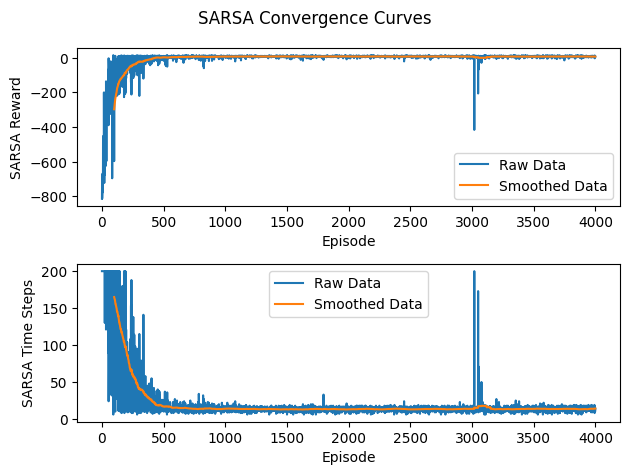

In [ ]:
# Plot the performance over time
fig, axs = plt.subplots(2)
axs[0].set_xlabel("Episode")
axs[1].set_xlabel("Episode")
axs[0].set_ylabel("SARSA Reward")
axs[1].set_ylabel("SARSA Time Steps")

# Data
num_episodes = len(optimal_sarsa_timesteps_list[:4000])
rewards_per_episode = optimal_sarsa_rewards_list[:4000]
steps_per_episode = optimal_sarsa_timesteps_list[:4000]

# Plot the raw data
axs[0].plot(range(num_episodes), rewards_per_episode, label='Raw Data')
axs[1].plot(range(num_episodes), steps_per_episode, label='Raw Data')

# Plot the smoothed data
window = 100
rewards_smoothed = np.convolve(rewards_per_episode, np.ones(window)/window, mode='valid')
steps_smoothed = np.convolve(steps_per_episode, np.ones(window)/window, mode='valid')

axs[0].plot(range(window-1, num_episodes), rewards_smoothed, label='Smoothed Data')
axs[1].plot(range(window-1, num_episodes), steps_smoothed, label='Smoothed Data')

axs[0].legend()
axs[1].legend()

plt.suptitle("SARSA Convergence Curves")
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'SARSA Accumulated Time Steps')

Text(0.5, 0, 'Time steps')

Text(0, 0.5, 'Episodes')

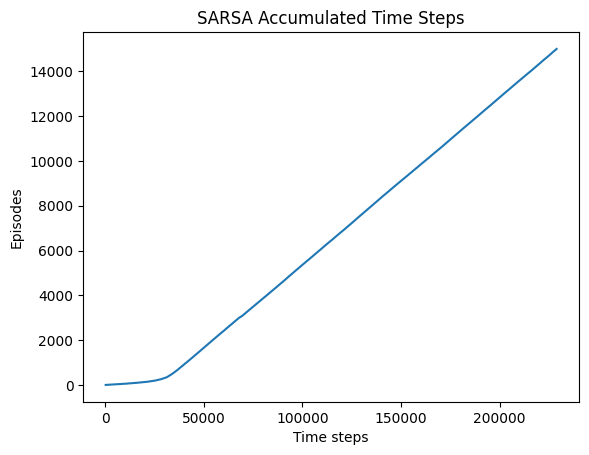

Text(0.5, 1.0, 'SARSA Accumulated Rewards')

Text(0.5, 0, 'Episodes')

Text(0, 0.5, 'Accumulated Reward per Episode')

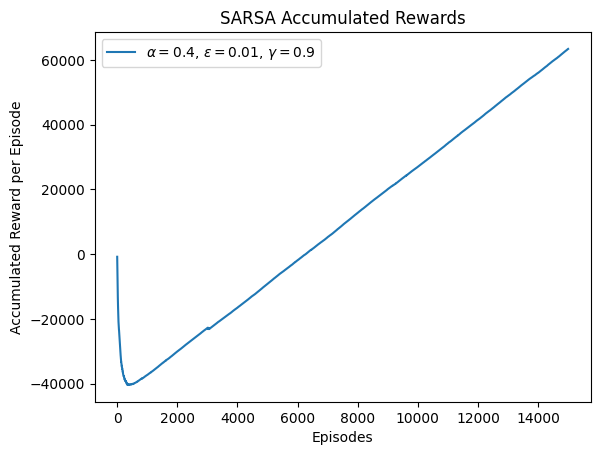

In [ ]:
plt.plot(accum_sarsa_timesteps, np.arange(1, len(accum_sarsa_timesteps) + 1))
plt.title('SARSA Accumulated Time Steps')
plt.xlabel('Time steps')
plt.ylabel('Episodes')
plt.show()

plt.plot(np.arange(1, len(accum_sarsa_rewards) + 1), accum_sarsa_rewards, label= r'$\alpha = 0.4$, $\epsilon = 0.01$, $\gamma = 0.9$')
plt.title('SARSA Accumulated Rewards')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward per Episode')
plt.legend()
plt.show()

Animated Test results for SARSA

In [ ]:
frames = []
r_total_sarsa  = 0
trials=10

for i in range(trials):
    # Reset environment
    s = env.reset()
    d = False

    #env.render(mode='rgb_array')#env.render()
    #plt.imshow(env.render(mode='rgb_array'))
    frames.append(env.render(mode="rgb_array"))
    #The Q-Table learning algorithm
    while d != True:

        a = np.argmax(sarsa_optimal_Q[s])
        n_s,r,d,_ = env.step(a)
        s = n_s
        r_total_sarsa += r
        frames.append(env.render(mode="rgb_array"))

render(frames, 'sarsa')
print(f"the average reward for {trials} test trials using SRASA is {np.mean(r_total_sarsa)}")


Moviepy - Building video sarsa_output.mp4.
Moviepy - Writing video sarsa_output.mp4



Moviepy - Done !
Moviepy - video ready sarsa_output.mp4


the average reward for 10 test trials using SRASA is 92.0


# **Double Q-Learning**

In [ ]:
def double_q_learning_agent(env,
                     num_episodes=100,
                     epsilon=0.1,  # exploration rate
                     alpha=0.9, # learning rate
                     gamma=0.9, # discount factor
                     test_while_train=False):

    # Initialize Q1 and Q2 tables
    Q1 = defaultdict(lambda: np.zeros(env.action_space.n))
    Q2 = defaultdict(lambda: np.zeros(env.action_space.n))


    # Initialize variables for tracking performance
    rewards_list = [] # rewards per episode
    timesteps_list = [] # timesteps per espisode

    # Double Q-Learning algorithm
    for i in range(num_episodes):
        state = env.reset()
        done = False
        total_reward_per_eps = 0 # accrued rewards during current episode
        time_steps_per_eps = 0 # number of time steps taken during current episode

        while not done:
            # Select action using epsilon-greedy policy
            if np.random.uniform(0, 1) <= epsilon: # explore - choose a random action
                action = env.action_space.sample()
            else:
                if Q1[state].sum() > Q2[state].sum():
                    action = np.argmax(Q1[state])
                else:
                    action = np.argmax(Q2[state])

            # Take action and observe next state and reward
            next_state, reward, done, _ = env.step(action)

            # Update Q1 and Q2 tables
            if np.random.uniform(0, 1) < 0.5:
                Q1[state][action] = (1 - alpha) * Q1[state][action] + alpha * (reward + gamma * Q2[next_state].max())
            else:
                Q2[state][action] = (1 - alpha) * Q2[state][action] + alpha * (reward + gamma * Q1[next_state].max())

            # Update state and performance variables
            state = next_state
            total_reward_per_eps += reward
            time_steps_per_eps += 1

        # Store the performance variables
        rewards_list.append(total_reward_per_eps)
        timesteps_list.append(time_steps_per_eps)

        # Evaluate Q1 and Q2 tables
        if test_while_train:
            test_log_step = 10 # test performance, after every 10 episodes of training.

            if i % test_log_step == 0 and i != 0:

                test_episodes = 5 # test for 5 episodes and report mean over them
                testing_rewards = []
                testing_timesteps =[]

                for test_eps in range(test_episodes):
                    # Reset environment
                    s = env.reset() # state
                    d = False # done flag
                    rewards_per_test_eps = 0
                    timesteps_per_test_eps = 0

                    while d != True:
                        a = np.argmax(Q1[s] + Q2[s])
                        n_s,r,d,_ = env.step(a)
                        s = n_s
                        rewards_per_test_eps += r
                        timesteps_per_test_eps +=1

                    testing_rewards.append(rewards_per_test_eps)
                    testing_timesteps.append(timesteps_per_test_eps)

                print(f"Testing results after {i} Episodes    Average Timesteps:{np.mean(testing_timesteps)}    Average Reward:{np.mean(testing_rewards)}")


    return rewards_list, timesteps_list, Q1, Q2

Environment Initialization

In [ ]:
env = gym.make("Taxi-v3") # training environment

Hyperparameters Tuning for Double Q-Learning

In [ ]:
dql_q1_values_dict = {} # dictionary to save the Q1 function values for each epsilon and alpha pairs
dql_q2_values_dict = {} # dictionary to save the Q2 function values for each epsilon and alpha pairs

dql_time_steps_per_episode_dict = {} # dictionary to save the time steps per episode for each epsilon and alpha pairs
dql_rewards_per_episode_dict = {} # dictionary to save the accrued rewards per episode for each epsilon alpha pair

dql_accum_time_steps_per_episode_dict = {} # dictionary to save the accumulated time steps per episode for each epsilon and alpha pairs
dql_accum_rewards_per_episode_dict = {}


for epsilon in [0.01, 0.05, 0.1, 0.15]: # epsilon greedy exploration rate
    for alpha in [0.2, 0.4, 0.6, 0.8, 1]: # learning rate

        dql_rewards_list, dql_timesteps_list, Q1, Q2 = double_q_learning_agent(env,
                                                                                num_episodes=15000,
                                                                                epsilon=epsilon,
                                                                                alpha=alpha,
                                                                                test_while_train=False)

        dql_time_steps_per_episode_accum = np.cumsum(dql_timesteps_list)
        dql_rewards_per_episode_accum = np.cumsum(dql_rewards_list)

        dql_q1_values_dict[(epsilon, alpha)] = Q1
        dql_q2_values_dict[(epsilon, alpha)] = Q2

        dql_time_steps_per_episode_dict[(epsilon, alpha)] = dql_timesteps_list
        dql_rewards_per_episode_dict[(epsilon, alpha)] = dql_rewards_list

        dql_accum_time_steps_per_episode_dict[(epsilon, alpha)] = dql_time_steps_per_episode_accum
        dql_accum_rewards_per_episode_dict[(epsilon, alpha)] = dql_rewards_per_episode_accum


In [ ]:
# plotting the different accumulated time steps for each epsilon and alpha
fig = make_subplots(rows=1,cols=1)
for key,values in dql_accum_rewards_per_episode_dict.items():
    fig.append_trace(go.Scatter(x=np.arange(1, len(values) + 1), #
                                y=values,
                                name= "epsilon = {}, alpha= {}".format(key[0],key[1]),
                                mode ='lines',
                                hoverlabel=dict(namelength=-1)
                                ),
                     row=1,
                     col=1)

fig.update_layout(title =  "Double Q-Learning Accumulated Rewards for Different Epsilon and Alpha",
                  xaxis_title = "Episodes",
                  yaxis_title = "Accumulated Reward")

Obtaining the reached Optimal Hyperparameters Values

In [ ]:
# obtaining the optimal epsilon and alpha pair based in the smallest average number of steps taken across all episodes
dql_eps_alpha_pair = [] # list of epsilon_alpha pairs tuple
dql_steps_taken = [] # list of lists of steps taken for each epsilon_alpha pair
dql_rewards_accrued = [] # list of lists of accrued rewards for each epsilon_alpha pair

for key,values in dql_time_steps_per_episode_dict.items(): # values is a list (timesteps for each eps)
    dql_eps_alpha_pair.append(key)
    dql_steps_taken.append(values)

for key,values in dql_rewards_per_episode_dict.items(): # values is a list (reward in each eps)
    dql_rewards_accrued.append(values)

dql_steps_taken = np.array(dql_steps_taken) # converting list to numpy array
mean_steps_taken = np.mean(dql_steps_taken, axis =1) # calculating mean number of steps for each epsilon_alpha pair
min_mean_steps_index = np.argmin(mean_steps_taken) # getting the index of the smallest mean number of steps

dql_rewards_accrued = np.array(dql_rewards_accrued)
mean_rewards_accrued = np.mean(dql_rewards_accrued, axis =1)
max_mean_rewards_accrued_index = np.argmax(mean_rewards_accrued)

#print(min_mean_steps_index == max_mean_rewards_accrued_index)

dql_optimal_epsilon_alpha_pair = dql_eps_alpha_pair[min_mean_steps_index] # using the obtained index to get the corresponds optimal epsilon alpha pair values
print(f"Optimal epsilon is {dql_optimal_epsilon_alpha_pair[0]} with optimal alpha equal {dql_optimal_epsilon_alpha_pair[1]}, \nAverage number of steps: {np.min(mean_steps_taken)} and average reward: {np.max(mean_rewards_accrued)} overall training episodes")

False
Optimal epsilon is 0.1 with optimal alpha equal 0.8, 
Average number of steps: 18.905666666666665 and average reward: -4.346333333333333 overall training episodes


Using Optimal Hyperparameters to train the Double Q-learning Agent and show testing performance every 10 episodes

In [ ]:
optimal_epsilon = dql_optimal_epsilon_alpha_pair[0]
optimal_alpha = dql_optimal_epsilon_alpha_pair[1]

optimal_dql_rewards_list, optimal_dql_timesteps_list, optimal_Q1, optimal_Q2 = double_q_learning_agent(env,
                                                                                                        num_episodes=15000,
                                                                                                        epsilon=optimal_epsilon,
                                                                                                        alpha=optimal_alpha,
                                                                                                        test_while_train=True) # set "test_while_train" to True to monitor testing results

accum_dql_timesteps = np.cumsum(optimal_dql_timesteps_list)
accum_qdl_rewards = np.cumsum(optimal_dql_rewards_list)

Testing results after 10 Episodes    Average Timesteps:200.0    Average Reward:-558.2
Testing results after 20 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 30 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 40 Episodes    Average Timesteps:200.0    Average Reward:-920.0
Testing results after 50 Episodes    Average Timesteps:200.0    Average Reward:-560.0
Testing results after 60 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 70 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 80 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 90 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 100 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 110 Episodes    Average Timesteps:200.0    Average Reward:-200.0
Testing results after 120 Episodes    Average Timest

Optimal Double Q-Learning Convergence Curves

Text(0.5, 0, 'Episode')

Text(0.5, 0, 'Episode')

Text(0, 0.5, 'Reward')

Text(0, 0.5, 'Steps')

Text(0.5, 0.98, 'Double Q-Learning Convergence Curves')

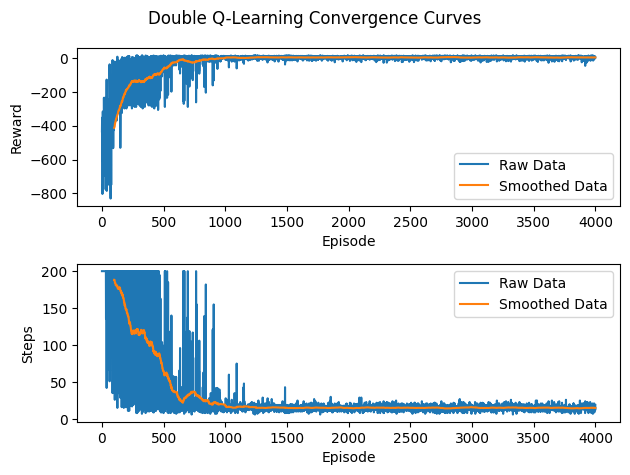

In [ ]:
# Plot the performance over time
fig, axs = plt.subplots(2)
axs[0].set_xlabel("Episode")
axs[1].set_xlabel("Episode")
axs[0].set_ylabel("Reward")
axs[1].set_ylabel("Steps")

# Data
num_episodes = len(optimal_dql_timesteps_list[:4000])
rewards_per_episode = optimal_dql_rewards_list[:4000]
steps_per_episode = optimal_dql_timesteps_list[:4000]

# Plot the raw data
axs[0].plot(range(num_episodes), rewards_per_episode, label='Raw Data')
axs[1].plot(range(num_episodes), steps_per_episode, label='Raw Data')

# Plot the smoothed data
window = 100
rewards_smoothed = np.convolve(rewards_per_episode, np.ones(window)/window, mode='valid')
steps_smoothed = np.convolve(steps_per_episode, np.ones(window)/window, mode='valid')

axs[0].plot(range(window-1, num_episodes), rewards_smoothed, label='Smoothed Data')
axs[1].plot(range(window-1, num_episodes), steps_smoothed, label='Smoothed Data')

axs[0].legend()
axs[1].legend()

plt.suptitle("Double Q-Learning Convergence Curves")
plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Double Q-Learning Accumulated Time Steps')

Text(0.5, 0, 'Time steps')

Text(0, 0.5, 'Episodes')

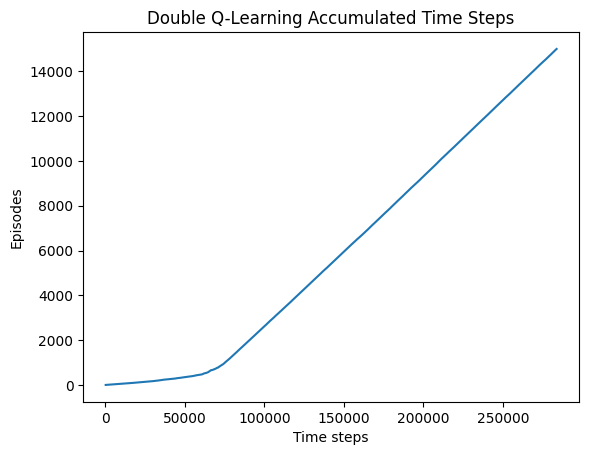

Text(0.5, 1.0, 'Double Q-Learning Rewards')

Text(0.5, 0, 'Episodes')

Text(0, 0.5, 'Accumulated Reward per Episode')

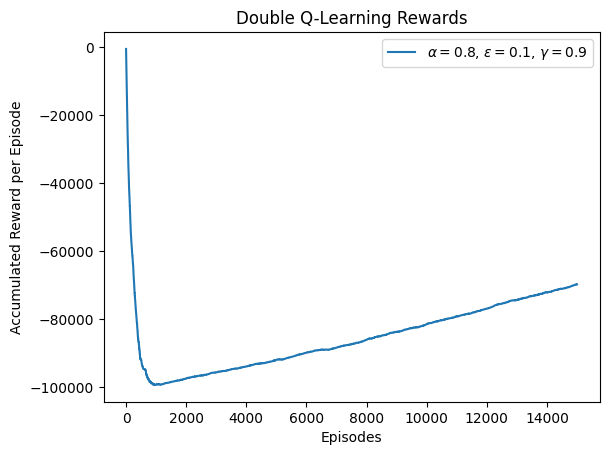

In [ ]:
plt.plot(accum_dql_timesteps, np.arange(1, len(accum_dql_timesteps) + 1))
plt.title('Double Q-Learning Accumulated Time Steps')
plt.xlabel('Time steps')
plt.ylabel('Episodes')
plt.show()

plt.plot(np.arange(1, len(accum_qdl_rewards) + 1), accum_qdl_rewards, label= r'$\alpha = 0.8$, $\epsilon = 0.1$, $\gamma = 0.9$')
plt.title('Double Q-Learning Rewards')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward per Episode')
plt.legend()
plt.show()

Animated Test results for Double Q-Learning

In [ ]:
# Render video
frames = []
r_total_double_qlearning  = 0
trials=4

for i in range(trials):
    # Reset environment
    s = env.reset()
    d = False

    #env.render(mode='rgb_array')#env.render()
    #plt.imshow(env.render(mode='rgb_array'))
    frames.append(env.render(mode="rgb_array"))
    #The Q-Tablelearning algorithm
    while d != True:
        a = np.argmax(optimal_Q1[s] + optimal_Q2[s])
        n_s, r, d, _ = env.step(a)
        s = n_s
        r_total_double_qlearning += r
        frames.append(env.render(mode="rgb_array"))

render(frames, 'double_q_learning')
print(f"the average reward for {trials} test trials is {r_total_double_qlearning / trials}")

Moviepy - Building video double_q_learning_output.mp4.
Moviepy - Writing video double_q_learning_output.mp4



Moviepy - Done !
Moviepy - video ready double_q_learning_output.mp4


the average reward for 4 test trials is 6.5


# **DQN**

In [ ]:
# Configure TensorFlow to use the GPU
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    print("Yes")


Yes


In [ ]:
# DQN Agent for the Cartpole
# it uses Neural Network to approximate q function
# and replay memory & target q network
class DQNAgent:
    def __init__(self,
                 model,
                 target_model,
                 state_size,
                 action_size,
                 max_replay_entries = 10000,
                 train_start = 1000,
                 batch_size = 256,
                 epsilon = 0.05,
                 discount_factor = 0.99,
                 #learning_rate = 0.001
                 ):

        # get size of state and action
        self.state_size = state_size
        self.action_size = action_size

        # These are hyper parameters for the DQN
        self.discount_factor = discount_factor
        #self.learning_rate = learning_rate
        self.epsilon = epsilon

        self.batch_size = batch_size # number of samples per update
        self.train_start = train_start # minimum number of samples in replay buffer to start updating

        # create replay buffer using deque
        # once we reach maxlen and deque is full, when new items are added, a corresponding number of items will be discarded from the beginning of the deque
        # the deque is a way of tracking where the most recent activity is of interest
        self.memory = deque(maxlen = max_replay_entries)

        # create main model and target model
        self.model = model
        self.target_model = target_model

        # initialize target model
        self.update_target_model()


    # updating the critic model weights to be same as the actor model
    def update_target_model(self):
        self.target_model.set_weights(self.model.get_weights())


    # get action from model using epsilon-greedy policy
    def get_action(self, state):
        if np.random.rand() <= self.epsilon:
            return random.randrange(self.action_size)
        else:
            Q_values = self.model(state)
            return np.argmax(Q_values)


    # save sample <s,a,r,s'> to the replay memory
    def add_sample_to_buffer(self, state, action, reward, next_state, done):
        self.memory.append((state, action, reward, next_state, done))


    # pick samples randomly from replay memory (with batch_size)
    def train_model(self):
        if len(self.memory) < self.train_start: # do nothing till the replay buffer is sufficiently filled
            return
        # take a random sample from the replay buffer with number of samples determined by "batch_size"
        mini_batch = random.sample(self.memory, self.batch_size)

        actor_nn_current_state = np.zeros((self.batch_size, self.state_size))
        critic_nn_next_state = np.zeros((self.batch_size, self.state_size))
        actions, rewards, done = [], [], []

        for i in range(self.batch_size): # batch_size is a list of tuples each tuple is <s,a,r,s'>
            actor_nn_current_state[i] = mini_batch[i][0]
            actions.append(mini_batch[i][1])
            rewards.append(mini_batch[i][2])
            critic_nn_next_state[i] = mini_batch[i][3]
            done.append(mini_batch[i][4])

        # convert it to tensor to avoid the recreation of graph and RAM consumption increase
        actor_nn_current_state_tensor = tf.convert_to_tensor(actor_nn_current_state, dtype=tf.float32)
        # the target term in the td error (calculating it in below way using the actor NN to get shape of the array)
        target = self.model(actor_nn_current_state_tensor) # this value will be overwritten (tensor)
        target_unstacked = tf.unstack(target) # unstacked tesnor to allow item assignment (list of tensors where each row is a tensor)

        # convert it to tensor to avoid the recreation of graph and RAM consumption increase
        critic_nn_next_state_tensor = tf.convert_to_tensor(critic_nn_next_state, dtype=tf.float32)
        # predicted Q values from the critic neural network
        Q_vals_critic_nn = self.target_model(critic_nn_next_state_tensor)

        # adusting the "target" value in the td error for each of the samples in the replay buffer batch
        for i in range(self.batch_size):
            if done[i]: # terminal state so get just the reward R no bootstraping
                #target[i][actions[i]] = rewards[i]
                row = target_unstacked[i].numpy() # converting tensor to numpy array for item assignment
                row[actions[i]] = rewards[i]
                row_tensor = tf.convert_to_tensor(row, dtype=tf.float32)
                target_unstacked[i] = row_tensor

            else: # Q Learning: get maximum Q value at s' from target model
                #target[i][actions[i]] = rewards[i] + self.discount_factor * (np.amax(Q_vals_critic_nn[i]))
                row = target_unstacked[i].numpy() # converting tensor to numpy array for item assignment
                row[actions[i]] = rewards[i] + self.discount_factor * (np.amax(Q_vals_critic_nn[i]))
                row_tensor = tf.convert_to_tensor(row, dtype=tf.float32)
                target_unstacked[i] = row_tensor

        target = tf.stack(target_unstacked) # convert target to tensor again from being list of tensors

        # and do actor nn model fit
        self.model.fit(actor_nn_current_state_tensor, target, batch_size=self.batch_size, epochs=1, verbose=0)



#### Model Training

In [ ]:
env = gym.make("Taxi-v3")
# get size of state and action from environment
state_size = 1
action_size = env.action_space.n
epsilon = 0.1
learning_rate = 0.005

# approximate Q function using Neural Network
# state is input and Q Value of each action is output of network
def build_model(learning_rate):
    model = Sequential()
    model.add(tf.keras.layers.Input(shape=(state_size,)))
    model.add(Dense(10, input_dim=state_size, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(256, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(512, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(512, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(512, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(512, activation='relu', kernel_initializer='he_uniform'))
    model.add(Dense(action_size, activation='linear', kernel_initializer='he_uniform'))
    model.summary()
    model.compile(loss='mse', optimizer=Adam(learning_rate))
    return model

model = build_model(learning_rate)
target_model = build_model(learning_rate)

agent = DQNAgent(model, target_model,state_size, action_size, epsilon=epsilon)


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 10)                20        
_________________________________________________________________
dense_1 (Dense)              (None, 128)               1408      
_________________________________________________________________
dense_2 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_3 (Dense)              (None, 512)               131584    
_________________________________________________________________
dense_4 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_5 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_6 (Dense)              (None, 512)               2

In [ ]:
%%time
EPISODES = 1000

scores, episodes, timesteps = [], [], []

test_while_train =True


for e in range(EPISODES):
    done = False
    score = 0
    timestep_per_eps =0
    state = env.reset()
    state = np.reshape(state, [1, state_size])
    #print(f"new episode: {e}")

    while not done:

        # get action for the current state on ob epsilon greedy policy
        action = agent.get_action(state)

        # go one step in environment
        next_state, reward, done, _ = env.step(action)
        next_state = np.reshape(next_state, [1, state_size]) # converting row to column (input to NN model)

        # save the sample <s, a, r, s'> to the replay memory
        agent.add_sample_to_buffer(state, action, reward, next_state, done)

        #every time step do the training
        agent.train_model()
        score += reward
        timestep_per_eps +=1
        state = next_state
        #print(f"timestep:{timestep_per_eps} ")
        #print(f"done:{done,timestep_per_eps}")

        if done:

            # every episode update the target model to be same with model
            agent.update_target_model()
            #_ = gc.collect() # to avoid memory leak and RAM consumption

            # every episode, plot the play time
            scores.append(score)
            episodes.append(e)
            timesteps.append(timestep_per_eps)

            # if e % 10 == 0 and e != 0:
            #   print("Episode:", e,
            #         "   Score:", score,
            #         "   Memory length:",len(agent.memory),
            #         "   Timesteps:", timestep_per_eps)


    if test_while_train:
        test_log_step = 10 # test performance, after every 10 episodes of training.

        if e % test_log_step == 0 and e != 0:

            test_episodes = 5 # test for 5 episodes and report mean over them
            testing_rewards = []
            testing_timesteps =[]

            for test_eps in range(test_episodes):
                # Reset environment
                s = env.reset() # state
                s = np.reshape(s, [1, state_size])

                d = False # done flag
                rewards_per_test_eps = 0
                timesteps_per_test_eps = 0

                while d != True:
                    # a = np.argmax(Q_l[s]) # greedy action is taken
                    a= np.argmax(agent.model(s))

                    n_s,r,d,_ = env.step(a)
                    s = n_s
                    s = np.reshape(s, [1, state_size])

                    rewards_per_test_eps += r
                    timesteps_per_test_eps +=1

                testing_rewards.append(rewards_per_test_eps)
                testing_timesteps.append(timesteps_per_test_eps)


            print("Episode:", e,
                    "  Traning  Score:", score,
                    "   Memory length:",len(agent.memory),
                    "  Training Timesteps:", timestep_per_eps)

            print(f"Testing results after {e} Episodes   Average Timesteps:{np.mean(testing_timesteps)}   Average Reward:{np.mean(testing_rewards)} averaged over 5 Episodes \n ")



Episode: 10   Traning  Score: -245    Memory length: 10000   Training Timesteps: 200
Testing results after 10 Episodes   Average Timesteps:200.0   Average Reward:-200.0 averaged over 5 Episodes 
 
Episode: 20   Traning  Score: -254    Memory length: 10000   Training Timesteps: 200
Testing results after 20 Episodes   Average Timesteps:200.0   Average Reward:-200.0 averaged over 5 Episodes 
 
Episode: 30   Traning  Score: -263    Memory length: 10000   Training Timesteps: 200
Testing results after 30 Episodes   Average Timesteps:200.0   Average Reward:-200.0 averaged over 5 Episodes 
 
Episode: 40   Traning  Score: -245    Memory length: 10000   Training Timesteps: 200
Testing results after 40 Episodes   Average Timesteps:200.0   Average Reward:-200.0 averaged over 5 Episodes 
 
Episode: 50   Traning  Score: -236    Memory length: 10000   Training Timesteps: 200
Testing results after 50 Episodes   Average Timesteps:200.0   Average Reward:-200.0 averaged over 5 Episodes 
 
Episode: 60   T

Text(0.5, 1.0, 'DQN Accumulated Time Steps')

Text(0.5, 0, 'Time steps')

Text(0, 0.5, 'Episodes')

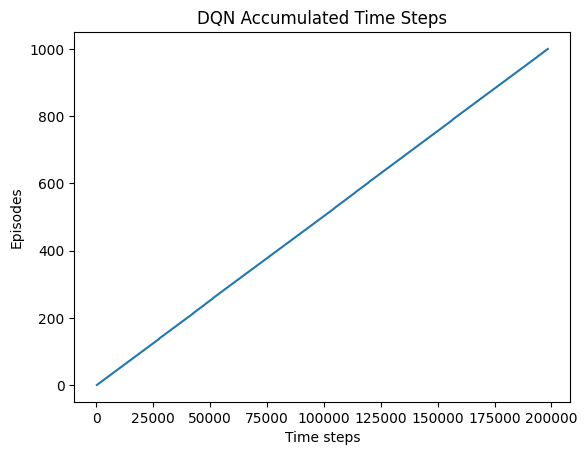

Text(0.5, 1.0, 'DQN Convergence')

Text(0.5, 0, 'Episodes')

Text(0, 0.5, 'Time steps per Episode')

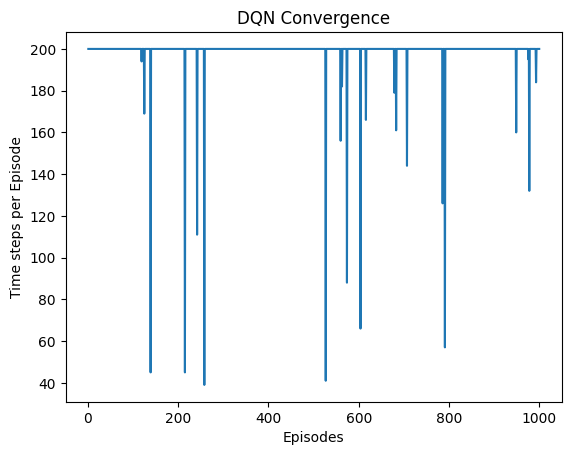

Text(0.5, 1.0, 'DQN Rewards')

Text(0.5, 0, 'Episodes')

Text(0, 0.5, 'Accumulated Reward per Episode')

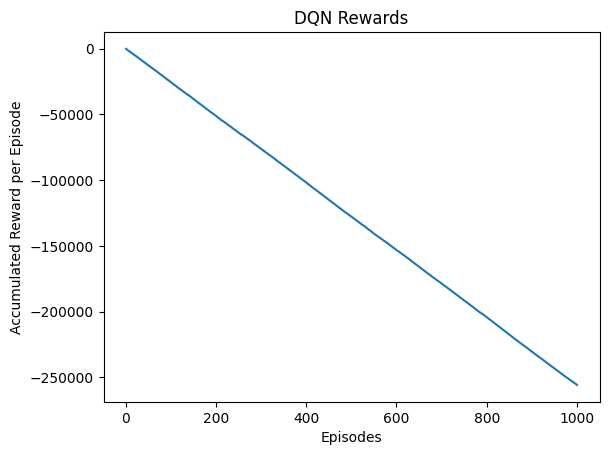

In [ ]:
#pylab.plot(episodes, scores, 'b')

scores_accum = np.cumsum(scores)
timesteps_accum = np.cumsum(timesteps)

plt.plot(timesteps_accum, np.arange(1, len(timesteps_accum) + 1))
plt.title('DQN Accumulated Time Steps')
plt.xlabel('Time steps')
plt.ylabel('Episodes')
plt.show()

plt.plot(np.arange(1, len(timesteps[:10000]) + 1), timesteps[:10000])
plt.title('DQN Convergence')
plt.xlabel('Episodes')
plt.ylabel('Time steps per Episode')
plt.show()

plt.plot(np.arange(1, len(scores_accum[:10000]) + 1), scores_accum[:10000])
plt.title('DQN Rewards')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward per Episode')
plt.show()

# Comparisons


Text(0.5, 1.0, 'Different RL Algorithms Comparison')

Text(0.5, 0, 'Episodes')

Text(0, 0.5, 'Accumulated Reward')

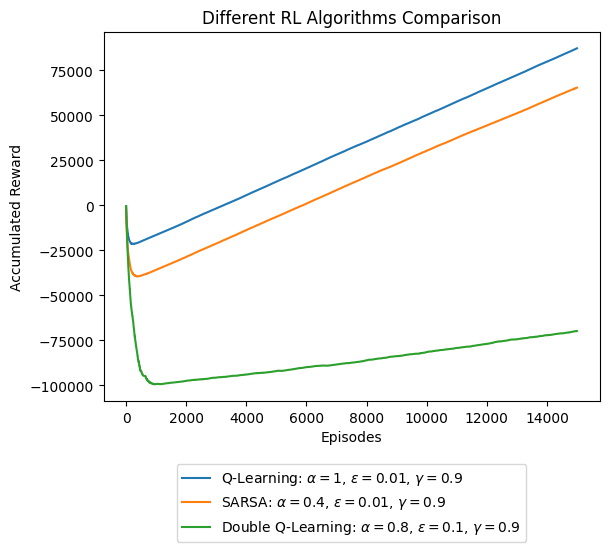

In [ ]:
plt.plot(accum_rewards, label=r'Q-Learning: $\alpha = 1$, $\epsilon = 0.01$, $\gamma = 0.9$')
plt.plot(accum_sarsa_rewards, label=r'SARSA: $\alpha = 0.4$, $\epsilon = 0.01$, $\gamma = 0.9$')
plt.plot(accum_qdl_rewards, label=r'Double Q-Learning: $\alpha = 0.8$, $\epsilon = 0.1$, $\gamma = 0.9$')

plt.title('Different RL Algorithms Comparison')
plt.xlabel('Episodes')
plt.ylabel('Accumulated Reward')

plt.legend(loc = 'lower center', bbox_to_anchor = (0.5,-0.4,0,0))
plt.show()


Text(0.5, 1.0, 'Different RL Algorithms Comparison')

Text(0.5, 0, 'Time Steps')

Text(0, 0.5, 'Episodes')

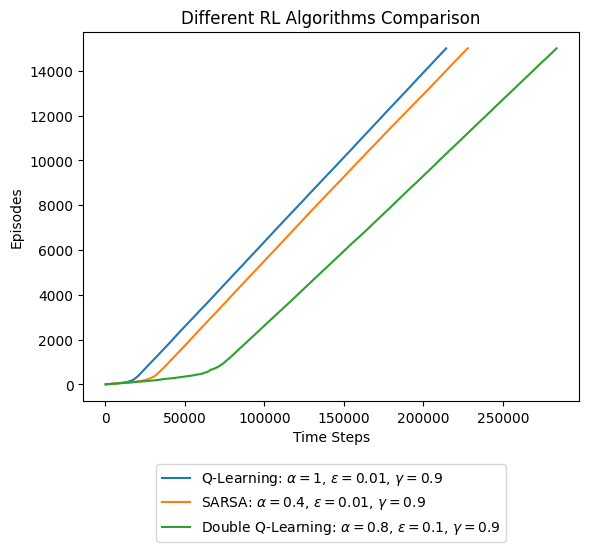

In [ ]:
plt.plot(accum_timesteps, np.arange(1, len(accum_timesteps) + 1), label=r'Q-Learning: $\alpha = 1$, $\epsilon = 0.01$, $\gamma = 0.9$')
plt.plot(accum_sarsa_timesteps, np.arange(1, len(accum_sarsa_timesteps) + 1), label=r'SARSA: $\alpha = 0.4$, $\epsilon = 0.01$, $\gamma = 0.9$')
plt.plot(accum_dql_timesteps, np.arange(1, len(accum_dql_timesteps) + 1), label=r'Double Q-Learning: $\alpha = 0.8$, $\epsilon = 0.1$, $\gamma = 0.9$')

plt.title('Different RL Algorithms Comparison')
plt.xlabel('Time Steps')
plt.ylabel('Episodes')

plt.legend(loc = 'lower center', bbox_to_anchor = (0.5,-0.4,0,0))
plt.show()